# Predicting House Prices in King County, Washington
### John Luo, Sean Lin

## Introduction

King County is the most populous county in Washington State. Within it lies Seattle, Washington's most populous city. Around two-thirds of King County's population lives in Seattle's suburbs. As we move westward, the county slowly transforms into countryside and farmland. King County is also host to the headquarters of 10 Fortune 500 Companies, including: Starbucks, Nordstrom, Alaska Airlines, Costco, Expedia, Microsoft, and Amazon. Microsoft and Amazon are two tech giants of the Big Five, coveted companies for those looking to work within the tech industry. 

For those interested in working at a Fortune 500 company based in Seattle, it is only natural to wonder about the price of housing in King County. That question is further complicated when we start to qualify the houses we're interested in: 3 Bed 2 Bath on 2 floors versus 4 Bed 4 Bath on 1 floor. It goes without saying the convenience that would come from being able to estimate the price of a house given a selection of desired features. The ability to assign a price tag to our "dream house" makes it more attainable for the dream to become a reality.

**In this tutorial, we walk through creating a linear regression model in Python to predict the price of properties in King County given some key attributes.** Along the way, we'll learn about data parsing, cleaning, and analysis in the context of data science. 

### Required Tools
Before starting, we'll need to install the following Python libraries:

In [1]:
import pandas as pd                                                 # For data storage and transformation
import numpy as np                                                  # Also for data storage and transformation
from urllib.request import urlopen                                  # For downloading the dataset
from io import BytesIO                                              # For reading and working with the scraped ZIP file
from zipfile import ZipFile                                         # For unzipping the scraped ZIP file
import seaborn as sns                                               # For plotting graphs
import matplotlib.pyplot as plt                                     # Also for plotting graphs
from sklearn import decomposition, preprocessing, model_selection   # For performing statistical analysis and modeling
import statsmodels.api as sm                                        # Also For performing statistical analysis modeling
from statsmodels.tools import eval_measures                         # Also For performing statistical analysis
import folium                                                       # For plotting on a map
import folium.plugins as plugins                                    # For additional features when plotting on a map

You can learn more about these libraries through their documentation!

| Library | Documentation |
| --- | --- |
| pandas | https://pandas.pydata.org/ |
| numpy | https://numpy.org/doc/ |
| urllib | https://docs.python.org/3/library/urllib.html|
| io | https://docs.python.org/3/library/io.html|
| zipfile| https://docs.python.org/3/library/zipfile.html|
| seaborn| https://seaborn.pydata.org/|
| matplotlib | https://matplotlib.org/3.3.3/contents.html|
| sklearn | https://scikit-learn.org/stable/|
| statsmodel.api| https://www.statsmodels.org/stable/api.html|

## Data Collection

We will be working with a dataset collected by the University of Chicago's Center for Spatial Data Science on "Home Sales in King County, WA from 2014-2015". In your own time, we highly recommend you learn more about the [Center for Spatial Data Science](https://spatial.uchicago.edu/) and dig into more of their other awesome datasets!

Let's start by grabbing loading the [housing sale dataset](https://geodacenter.github.io/data-and-lab//KingCounty-HouseSales2015/) into a Pandas Dataframe!

In [2]:
# Check out https://svaderia.github.io/articles/downloading-and-unzipping-a-zipfile/ for an in depth view on unzipping files in Python
url = "https://geodacenter.github.io/data-and-lab//data/kingcounty.zip"

with urlopen(url) as resp:
    with ZipFile(BytesIO(resp.read())) as z:
        z.extract(member="kingcounty/kc_house_data.csv")
        z.close()

df = pd.read_csv("kingcounty/kc_house_data.csv")
df = df.sort_values(by="date", axis=0)
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
16768,5561000190,20140502T000000,437500.0,3,2.25,1970,35100,2.0,0,0,...,9,1970,0,1977,0,98027,47.4635,-121.991,2340,35100
9596,472000620,20140502T000000,790000.0,3,2.50,2600,4750,1.0,0,0,...,9,1700,900,1951,0,98117,47.6833,-122.400,2380,4750
9587,1024069009,20140502T000000,675000.0,5,2.50,2820,67518,2.0,0,0,...,8,2820,0,1979,0,98029,47.5794,-122.025,2820,48351
20602,7853361370,20140502T000000,555000.0,4,2.50,3310,6500,2.0,0,0,...,8,3310,0,2012,0,98065,47.5150,-121.870,2380,5000
11577,5056500260,20140502T000000,440000.0,4,2.25,2160,8119,1.0,0,0,...,8,1080,1080,1966,0,98006,47.5443,-122.177,1850,9000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7898,1422700040,20150514T000000,183000.0,3,1.00,1170,7320,1.0,0,0,...,7,1170,0,1962,0,98188,47.4685,-122.282,2040,7320
928,8730000270,20150514T000000,359000.0,2,2.75,1370,1140,2.0,0,0,...,8,1080,290,2009,0,98133,47.7052,-122.343,1370,1090
5637,7923600250,20150515T000000,450000.0,5,2.00,1870,7344,1.5,0,0,...,7,1870,0,1960,0,98007,47.5951,-122.144,1870,7650
13053,5101400871,20150524T000000,445500.0,2,1.75,1390,6670,1.0,0,0,...,6,720,670,1941,0,98115,47.6914,-122.308,920,6380


There are 21,613 observation and 21 variables in our dataset. Let's take a closer look at what each variable name represents:

| Variable | Description|
| --- | --- |
| id | Unique identifier of the house |
| date | Date of sale |
| price | Sell price |
| bedrooms | Number of bedrooms | 
| bathrooms | Number of bathrooms. Noninteger values exist due to "1/2 bathrooms" and "3/4 bathrooms" |
| sqft_liv | Size of interior space in square feet | 
| sqft_lot | Size of land lot in square feet | 
| floors | Number of floors. Noninteger values exist due to "half floor" architecture | 
| waterfront | '1' if property has a waterfront, '0' if not |
| view | An index from 0 to 4 of how good the property's view is |
| condition | Condition of the house, ranked from 1 to 5, 5 being the greatest condition |
| grade | Classification by construction material and worksmanship quality. Numeric scale with higher numbers being better. For more information see the [King County glossary](https://info.kingcounty.gov/assessor/esales/Glossary.aspx?type=r) |
| sqft_above | Square feet above ground | 
| sqft_below | Square feet below ground |
| yr_built | Year built |
| yr_renov | Year renovated. '0' if never renovated |
| zipcode | 5 digit zip code |
| lat | Latitude |
| long | Longitude |
| squft_liv15 | Average size of interior space for closest 15 houses, in square feet |
| squft_lot15 | Average size of land lot for closest 15 houses, in square feet |

### Data Preprocessing

Armed with a better understanding of the dataset, let's clean it up in preparation for data analysis! We first want to check for any null or missing values across the Dataframe. Keep in mind that there are 21,613 observations, so every column should also contain 21,613 values. Let's verify this.

In [3]:
df.count()

id               21613
date             21613
price            21613
bedrooms         21613
bathrooms        21613
sqft_living      21613
sqft_lot         21613
floors           21613
waterfront       21613
view             21613
condition        21613
grade            21613
sqft_above       21613
sqft_basement    21613
yr_built         21613
yr_renovated     21613
zipcode          21613
lat              21613
long             21613
sqft_living15    21613
sqft_lot15       21613
dtype: int64

Nice! The Dataframe does not contain any `None` or `numpy.nan` values. But this doesn't mean we're not completely out of the woods yet. Let's take a deeper look at each column's summary statistics and see if there are any misreported observations.

In [4]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [5]:
df[df.bedrooms == 33]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
15870,2402100895,20140625T000000,640000.0,33,1.75,1620,6000,1.0,0,0,...,7,1040,580,1947,0,98103,47.6878,-122.331,1330,4700


Hm, some of these values don't make a lot of sense in the context of house sales. For example, it should not be possible to sell a house with 0 bathrooms (interestingly, zero-bedroom dwellings are a defined and legal residential dwelling). Additionally, something seems fishy about a house with 33 bedrooms but only 1.75 bathrooms on 1620 square feet. Let's remove these extraneous values from the Dataframe. This will help us build a more accurate model later on. 

In [6]:
df = df.drop(df[df.bedrooms == 33].index)
df = df.drop(df[df.bathrooms == 0].index)

df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.160200e+04,2.160200e+04,21602.000000,21602.000000,21602.000000,2.160200e+04,21602.000000,21602.000000,21602.000000,21602.000000,21602.000000,21602.000000,21602.000000,21602.000000,21602.000000,21602.000000,21602.000000,21602.000000,21602.000000,21602.000000
mean,4.580335e+09,5.401261e+05,3.370892,2.115753,2080.126146,1.510684e+04,1.494213,0.007546,0.234238,3.409592,7.657532,1788.495510,291.630636,1971.006157,84.445237,98077.950236,47.560065,-122.213967,1986.623414,12766.736923
std,2.876737e+09,3.671168e+05,0.905733,0.769010,918.161484,4.143004e+04,0.539761,0.086539,0.766309,0.650481,1.173611,827.771283,442.638912,29.374639,401.776985,53.509608,0.138556,0.140749,685.166307,27309.454207
min,1.000102e+06,7.800000e+04,0.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471025,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.617500e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068475e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10082.250000
max,9.900000e+09,7.700000e+06,11.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


Since the Dataframe is storing House Sales as observations, it is not guaranteed that each observation is for a unique house. It may be the case that a house was sold several times between 2014-2015. This may later introduce bias into our regression model. 
Let's remove all instances of duplicate houses. Since different observations on the same house represent different times the house was sold, let's resolve these entities by always using the most recent house sale. This way, we always preserve the most recent information about the house.

In [7]:
df = df.drop_duplicates(subset="id",keep="last")

df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.142500e+04,2.142500e+04,21425.000000,21425.000000,21425.000000,2.142500e+04,21425.000000,21425.000000,21425.000000,21425.000000,21425.000000,21425.000000,21425.000000,21425.000000,21425.000000,21425.000000,21425.000000,21425.000000,21425.000000,21425.000000
mean,4.580800e+09,5.416890e+05,3.371622,2.118355,2082.934656,1.513553e+04,1.496103,0.007608,0.235053,3.410548,7.662404,1791.067445,291.867211,1971.099510,84.773302,98077.872765,47.560169,-122.213768,1988.386791,12784.237340
std,2.876763e+09,3.673044e+05,0.904648,0.768746,918.864625,4.154826e+04,0.540159,0.086893,0.767084,0.649970,1.172388,828.704669,442.846391,29.386517,402.529730,53.473991,0.138594,0.140816,685.472311,27380.809425
min,1.000102e+06,7.800000e+04,0.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123050e+09,3.249000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1200.000000,0.000000,1952.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904921e+09,4.500000e+05,3.000000,2.250000,1920.000000,7.614000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.572000,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068900e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2220.000000,560.000000,1997.000000,0.000000,98117.000000,47.678000,-122.125000,2370.000000,10086.000000
max,9.900000e+09,7.700000e+06,11.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


Lastly, to aid in data analysis, let's "tidy up" this Dataframe by following the [Tidy Data standard](https://vita.had.co.nz/papers/tidy-data.html). To do this, we must ensure that each variable is stored in its own column. Currently, the `date` and `yr_renovated` columns stored more than one variable. Let's split and replace the `date` column into separate columns `year`, `month`, and `day`. For fun, we'll also add a `day_of_week` column. Let's also add  `is_renovated` column and replace all values of `0` in `yr_renovated` with `numpy.nan`.

In [8]:
df["date"] = pd.to_datetime(df.date)
df["year"] = df.date.dt.year
df["month"] = df.date.dt.month
df["day"] = df.date.dt.day
df["day_of_week"] = df.date.dt.day_name()
df = df.drop("date", axis=1)

df["is_renovated"] = np.where(df.yr_renovated == 0, 0, 1)
df["yr_renovated"] = df.yr_renovated.replace(to_replace=0, value=np.nan)

df

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,day,day_of_week,is_renovated
16768,5561000190,437500.0,3,2.25,1970,35100,2.0,0,0,4,...,98027,47.4635,-121.991,2340,35100,2014,5,2,Friday,0
9596,472000620,790000.0,3,2.50,2600,4750,1.0,0,0,4,...,98117,47.6833,-122.400,2380,4750,2014,5,2,Friday,0
9587,1024069009,675000.0,5,2.50,2820,67518,2.0,0,0,3,...,98029,47.5794,-122.025,2820,48351,2014,5,2,Friday,0
20602,7853361370,555000.0,4,2.50,3310,6500,2.0,0,0,3,...,98065,47.5150,-121.870,2380,5000,2014,5,2,Friday,0
11577,5056500260,440000.0,4,2.25,2160,8119,1.0,0,0,3,...,98006,47.5443,-122.177,1850,9000,2014,5,2,Friday,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7898,1422700040,183000.0,3,1.00,1170,7320,1.0,0,0,3,...,98188,47.4685,-122.282,2040,7320,2015,5,14,Thursday,0
928,8730000270,359000.0,2,2.75,1370,1140,2.0,0,0,3,...,98133,47.7052,-122.343,1370,1090,2015,5,14,Thursday,0
5637,7923600250,450000.0,5,2.00,1870,7344,1.5,0,0,3,...,98007,47.5951,-122.144,1870,7650,2015,5,15,Friday,0
13053,5101400871,445500.0,2,1.75,1390,6670,1.0,0,0,3,...,98115,47.6914,-122.308,920,6380,2015,5,24,Sunday,0


Our cleaned and tidied Dataframe now has 21,425 observations each representing a unique house that was sold in King County, WA between 2014-2015. With that, we are ready to begin data analysis!

## Exploratory Data Analysis and Visualization

### Summary Statistics
First, let's do some summary statistics: Mapping price distributions across the dataset

Let's take a look at the overall price distribution. What's the ballpark for housing prices in the county?

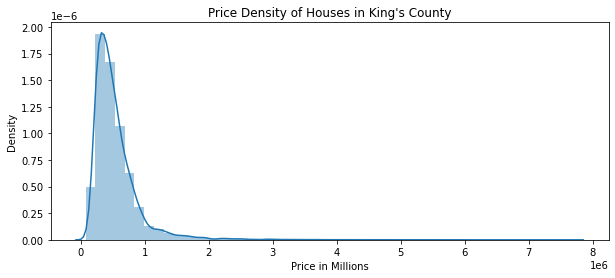

In [9]:
plt.figure(figsize=(10,4))

price_dist = sns.distplot(df["price"])
price_dist.set(xlabel="Price in Millions", title="Price Density of Houses in King's County")
plt.show()

As we can see, there is a noticeable right skew. This suggests that, on the more expensive side of houses, there's a large variety in the prices of houses.

Let's see if a logged distributed will create more symmetry and ergo more interpretability.


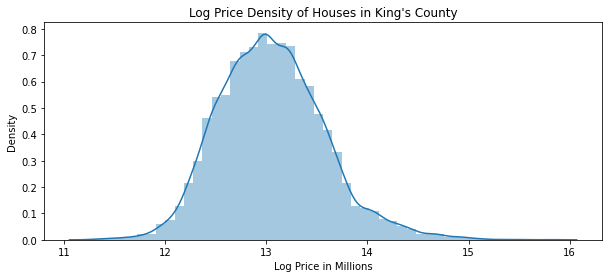

In [10]:
plt.figure(figsize=(10,4))

logged_price_dist = sns.distplot(np.log(df["price"]))
logged_price_dist.set(xlabel="Log Price in Millions", title="Log Price Density of Houses in King's County")
plt.show()

Looks good! It seems that applying a logarithm transform to the data made it more symmetric as a result. This is something we can work with later.

Next, let's take a look at the impact of the time of year on housing; both prices and frequency.

What days and months of the year were purchases made the most over 2014-2015?

In [11]:
# Creating groups
month_group = df.groupby(by=["month"])
day_group = df.groupby(by=["day_of_week"])

**Month's impact on frequency**

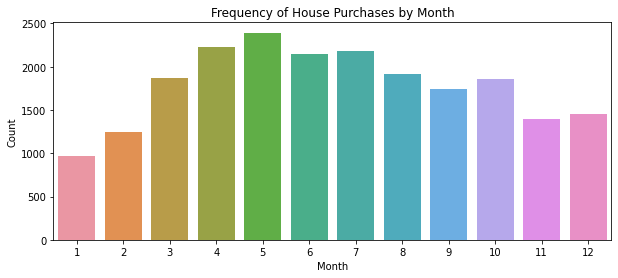

In [12]:
plt.figure(figsize=(10,4))

month_freq = month_group.size()
month_freq_plot = sns.barplot(month_freq.index, month_freq.values)
month_freq_plot.set(xlabel="Month", ylabel="Count", title="Frequency of House Purchases by Month")
plt.show()

**Month's impact on price**

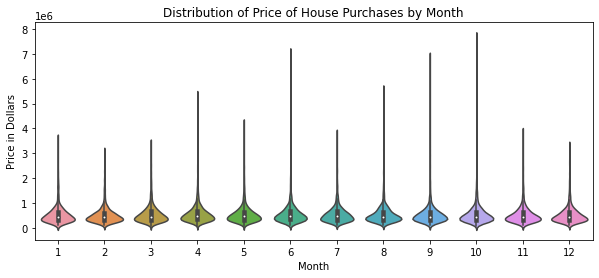

In [13]:
plt.figure(figsize=(10,4))

month_price_plot = sns.violinplot(x="month", y="price", data=df)
month_price_plot.set(xlabel="Month", ylabel="Price in Dollars", title="Distribution of Price of House Purchases by Month")
plt.show()

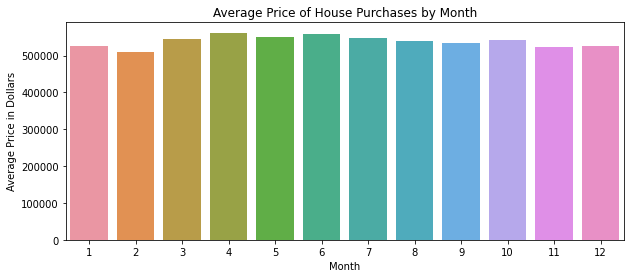

In [14]:
plt.figure(figsize=(10,4))

month_price = month_group["price"].mean()
month_avg_price_plot = sns.barplot(month_price.index, month_price.values)
month_avg_price_plot.set(xlabel="Month", ylabel="Average Price in Dollars", title="Average Price of House Purchases by Month")
plt.show()

Housing prices stayed relatively stable throughout the months, with a few in April, June, August, September, and October. While there doesn't seem to be much of a difference in the effect of the month on housing prices, there seems to be a noticeable relationship between the month and the frequency of purchases. Specifically, it seems that the middle months of March, May, June, and July have the highest frequency of purchases. There could be a variety of reasons for this, such as a warmer climate leading to more people touring houses or the time of year coinciding with the end of the school year giving more time to shop for houses.

**Day's impact on Frequency**

In [15]:
# Creating order list for use in ordering the bar plots

day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

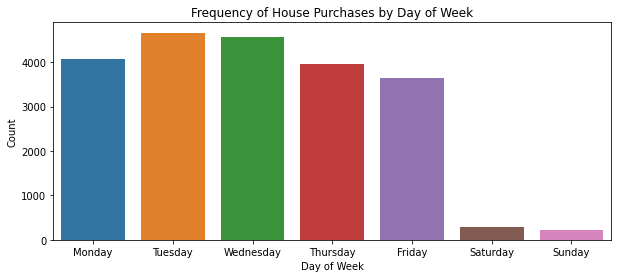

In [16]:
plt.figure(figsize=(10,4))

day_freq = day_group.size()
day_freq_plot = sns.barplot(x=day_freq.index, y=day_freq.values, order=day_order)
day_freq_plot.set(xlabel="Day of Week", ylabel="Count", title="Frequency of House Purchases by Day of Week")
plt.show()

**Day's impact on Price**

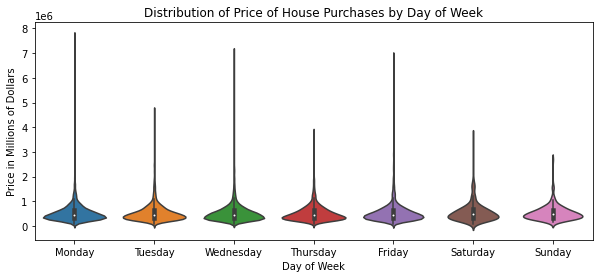

In [17]:
plt.figure(figsize=(10,4))

day_price_plot = sns.violinplot(x="day_of_week", y="price", data=df, order=day_order)
day_price_plot.set(xlabel="Day of Week", ylabel="Price in Millions of Dollars", title="Distribution of Price of House Purchases by Day of Week")
plt.show()

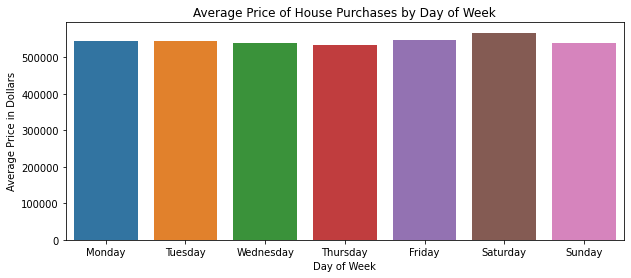

In [18]:
plt.figure(figsize=(10,4))

day_price = day_group["price"].mean()
day_avg_price_plot = sns.barplot(x=day_price.index, y=day_price.values, order=day_order)
day_avg_price_plot.set(xlabel="Day of Week", ylabel="Average Price in Dollars", title="Average Price of House Purchases by Day of Week")
plt.show()

Similar to months, the day of week didn't seem to affect the average price of house purchases very much, with Saturday slightly edging out other days. However, there's a clear trend in the effect on purchase frequency. Tuesday and Wednesday stand out as the most common while all weekdays were far more common than weekends. While I would imagine weekends would be easier for purchasers to spend time on buying houses, it seems that the sellers' work schedules, if they sell real estate full-time, may be more important.

**How about the number of floors, bedrooms, and bathroooms? How do these affect price? **

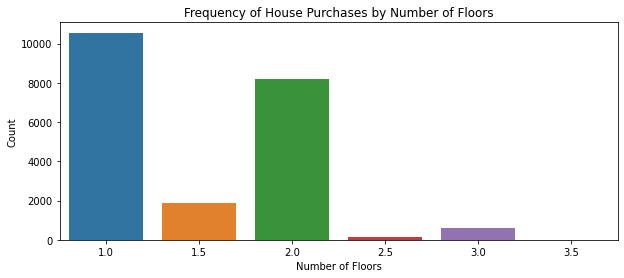

In [19]:
# Floor frequency

plt.figure(figsize=(10,4))

floor_group = df.groupby(by=["floors"])
floor_freq = floor_group.size()
floor_freq_plot = sns.barplot(floor_freq.index, floor_freq.values)
floor_freq_plot.set(xlabel="Number of Floors", ylabel="Count", title="Frequency of House Purchases by Number of Floors")
plt.show()

It seems that one floor houses are the most common, followed by the two floor houses. Due to the low quantity of houses of other floor numbers, any outliers will have a greater effect, as we'll see later.

**Floors**

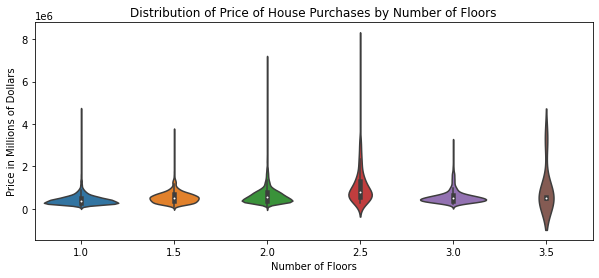

In [20]:
# Floor price distribution

plt.figure(figsize=(10,4))

floor_price_plot = sns.violinplot(x="floors", y="price", data=df)
floor_price_plot.set(xlabel="Number of Floors", ylabel="Price in Millions of Dollars", title="Distribution of Price of House Purchases by Number of Floors")
plt.show()

As we can see, 2.5 and 3.5 floors have very noticeable outliers in house prices. Since these are pretty uncommon houses with very low frequency, we'll need to be careful in interpreting the information to account for these outliers.

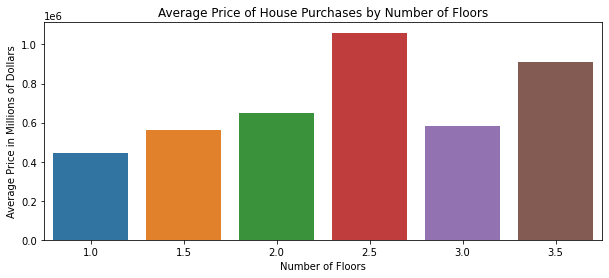

In [21]:
# Average prices

plt.figure(figsize=(10,4))

floor_price = floor_group["price"].mean()
floor_avg_price_plot = sns.barplot(x=floor_price.index, y=floor_price.values)
floor_avg_price_plot.set(xlabel="Number of Floors", ylabel="Average Price in Millions of Dollars", title="Average Price of House Purchases by Number of Floors")
plt.show()

As mentioned earlier, these averages can be misleading. 2.5 and 3.5 floor averages are inflated by the combination of their low frequency and large outliers. It's hard to take these into account with such little data, but it seems that, outside of these two outliers, the 2 floor houses have the highest overall prices. It's hard to tell if there's a strong correlation or not with number of floors, since the trend is so irregular and the range of floors is only 3.5.

**Bedrooms**

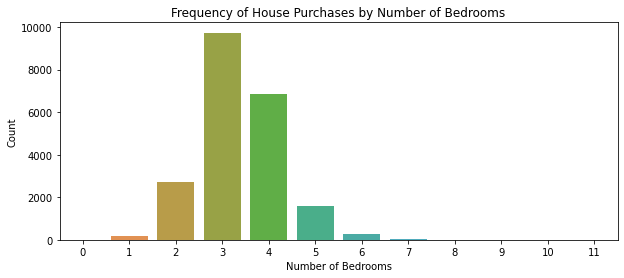

In [22]:
# Bedroom frequency

plt.figure(figsize=(10,4))

bed_group = df.groupby(by=["bedrooms"])
bed_freq = bed_group.size()
bed_freq_plot = sns.barplot(bed_freq.index, bed_freq.values)
bed_freq_plot.set(xlabel="Number of Bedrooms", ylabel="Count", title="Frequency of House Purchases by Number of Bedrooms")
plt.show()

It seems like the most frequent houses are 3 bedrooms. As before, with lower frequency counts in 0, 1 and 5+ bedroom houses, we need to be wary of the presence and effect of outliers. 3 and 4 bedrooms being the most common doesn't seem like that much of a surprise, since that should be enough to accommodate families or roommate situations, while any more may be too many bedrooms and any fewer may butt heads with the benefits of apartments.

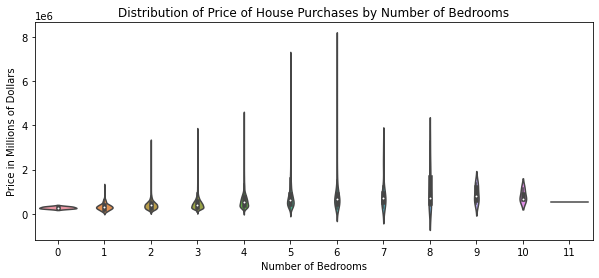

In [23]:
# Bedroom price distribution

plt.figure(figsize=(10,4))

bed_price_plot = sns.violinplot(x="bedrooms", y="price", data=df)
bed_price_plot.set(xlabel="Number of Bedrooms", ylabel="Price in Millions of Dollars", title="Distribution of Price of House Purchases by Number of Bedrooms")
plt.show()

For bedroom numbers 7 and 8, there seems to be a noticeable skew toward higher prices. Combined with low frequencies, we can expect these two to be some of the highest.

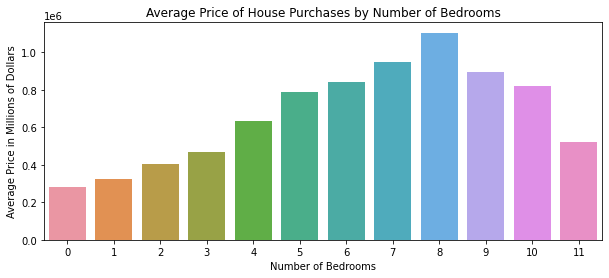

In [24]:
# Average prices

plt.figure(figsize=(10,4))

bed_price = bed_group["price"].mean()
bed_avg_price_plot = sns.barplot(x=bed_price.index, y=bed_price.values)
bed_avg_price_plot.set(xlabel="Number of Bedrooms", ylabel="Average Price in Millions of Dollars", title="Average Price of House Purchases by Number of Bedrooms")
plt.show()

Due to the aforementioned skews, 7 and 8 bedroom houses sold for the most on average. While there is a generally increasing trend with number of bedrooms and price, it drops after 8 bedrooms. This could possibly be due to the small amount of data for higher bedroom houses, or those houses with that number of bedrooms may be undesirable in one way or another. Either way, there seems to be a noticeable positive correlation between number of bedrooms and price up until 8 bedrooms.

**Bathrooms**

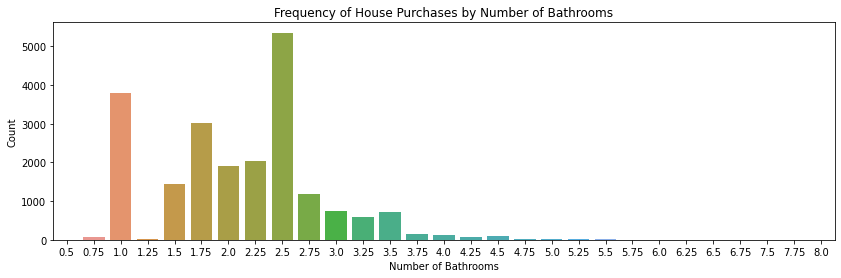

In [25]:
# Bathroom frequency

plt.figure(figsize=(14,4))

bath_group = df.groupby(by=["bathrooms"])
bath_freq = bath_group.size()
bath_freq_plot = sns.barplot(bath_freq.index, bath_freq.values)
bath_freq_plot.set(xlabel="Number of Bathrooms", ylabel="Count", title="Frequency of House Purchases by Number of Bathrooms")
plt.show()

It seems that most of the houses are concentrated within the 1-2.5 bathroom range, with relatively very few houses outside of that range.

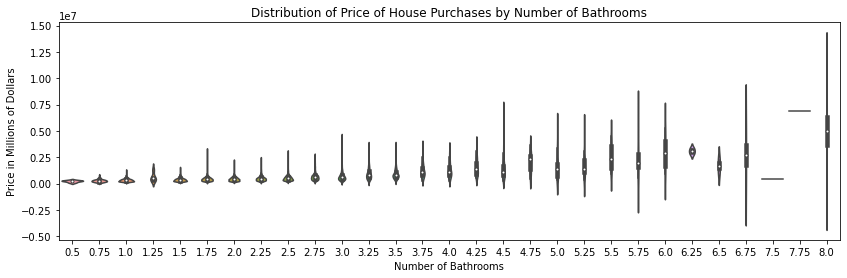

In [26]:
# Bathroom price distribution

plt.figure(figsize=(14,4))

bath_price_plot = sns.violinplot(x="bathrooms", y="price", data=df)
bath_price_plot.set(xlabel="Number of Bathrooms", ylabel="Price in Millions of Dollars", title="Distribution of Price of House Purchases by Number of Bathrooms")
plt.show()

Once bathrooms get to the 4.75 mark, the spread of their prices becomes far greater. Combined with the extremely low amount of datapoints for houses with those numbers of bathrooms, what we can glean from those numbers is fairly low.  

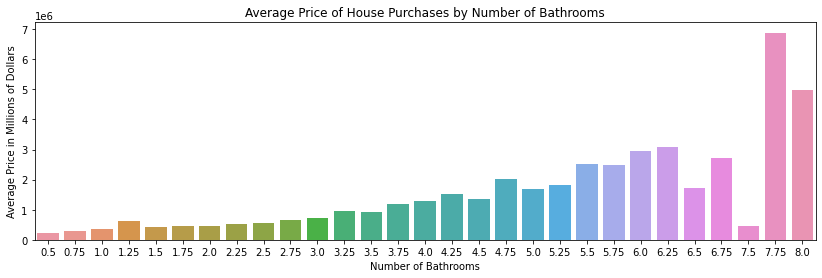

In [27]:
# Average prices

plt.figure(figsize=(14,4))

bath_price = bath_group["price"].mean()
bath_avg_price_plot = sns.barplot(x=bath_price.index, y=bath_price.values)
bath_avg_price_plot.set(xlabel="Number of Bathrooms", ylabel="Average Price in Millions of Dollars", title="Average Price of House Purchases by Number of Bathrooms")
plt.show()

Overall, it seems that there is a consistent increasing trend with the number of bathrooms. As mentioned before, above 4.5 bathrooms is a territory with few datapoints, but even excluding those, the trend seems to still hold.

**Analysis of floor/bedroom/bathroom**

How many renovations occurred? What was the distribution of years between built and renovation? did it differ by zipcode?

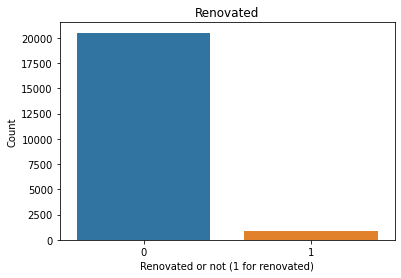

In [28]:
renovate_group = df.groupby(by=["is_renovated"])
renovate_freq = renovate_group.size()
renovate_freq_plot = sns.barplot(renovate_freq.index, renovate_freq.values)
renovate_freq_plot.set(xlabel="Renovated or not (1 for renovated)", ylabel="Count", title="Renovated")
plt.show()

Based off this chart, we can see that renovations were fairly rare for this county.

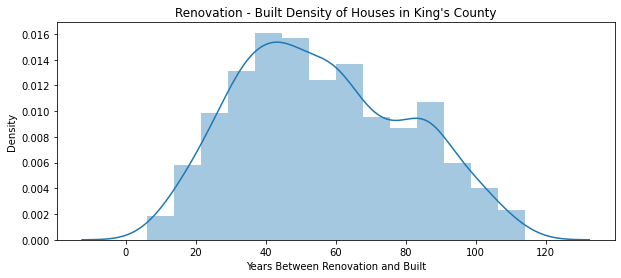

In [29]:
# Distribution of years passed

plt.figure(figsize=(10,4))

renovated = df[df["is_renovated"] == 1]
ren_year_dist = sns.distplot(renovated["yr_renovated"] - renovated["yr_built"])
ren_year_dist.set(xlabel="Years Between Renovation and Built", title="Renovation - Built Density of Houses in King's County")
plt.show()

It seems that there's a slightly bimodal distribution of years until renovation, with the highest frequency in the range of 40-60 years until renovation.

**What about the condition and grade of the house? How are those qualities distributed? **

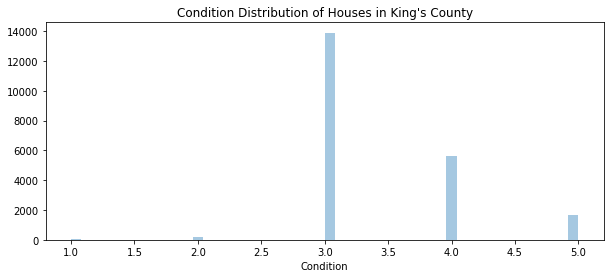

In [30]:
# Distribution of condition

plt.figure(figsize=(10,4))

cond_dist = sns.distplot(df["condition"], kde=False)
cond_dist.set(xlabel="Condition", title="Condition Distribution of Houses in King's County")
plt.show()

It seems that the majority of houses are in condition 3, or middle of the road. It's interesting to note that condition 1 and 2 houses are very infrequently sold. This could be due to some degree of self-selection---houses that are in worse condition may be less likely to be sold.

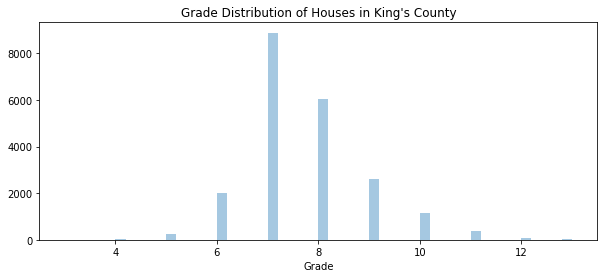

In [31]:
# Distribution of grade

plt.figure(figsize=(10,4))

cond_dist = sns.distplot(df["grade"], kde=False)
cond_dist.set(xlabel="Grade", title="Grade Distribution of Houses in King's County")
plt.show()

It seems that the grades are distributed fairly unimodally, with the majority of houses at grade 7. There are very few houses below that grade, which, as mentioned with condition, could be due to a degree of self-selection.

Now let's see some information on a map. The following code will produce a map from a sample of 5,000 from the data. It will color code by price bracket and let you filter by condition of the house.

In [32]:
# Determine price bucket, return integer indicating which bucket
def get_bucket(price):
    if price < 100000:      # Lower
        return 0
    elif price < 300000:    # Lower-med
        return 1
    elif price < 600000:    # Med
        return 2
    elif price < 1000000:   # Upper-med
        return 3
    else:                   # Upper
        return 4

# Given a bucket number, produce the color for use in map
def get_color(bucket):
    if bucket == 0:
        return "red"
    elif bucket == 1:
        return "orange"
    elif bucket == 2:
        return "green"
    elif bucket == 3:
        return "blue"
    else:
        return "purple"


In [33]:
# Filter map 

m = folium.Map(location=[47.5480, -121.9750])

s = df.sample(n=5000)

group1 = plugins.FeatureGroupSubGroup(m, 'Condition 1')
group2 = plugins.FeatureGroupSubGroup(m, 'Condition 2')
group3 = plugins.FeatureGroupSubGroup(m, 'Condition 3')
group4 = plugins.FeatureGroupSubGroup(m, 'Condition 4')
group5 = plugins.FeatureGroupSubGroup(m, 'Condition 5')

m.add_child(group1)
m.add_child(group2)
m.add_child(group3)
m.add_child(group4)
m.add_child(group5)

for j, row in s.iterrows():
    price = row["price"]
    price_bucket = get_bucket(price)
    marker = folium.CircleMarker(row[["lat","long"]],
        radius=5,
        color=get_color(price_bucket),
        popup=price)

    cond = row["condition"]
    if cond == 1:
        group1.add_child(marker)
    elif cond == 2:
        group2.add_child(marker)
    elif cond == 3:
        group3.add_child(marker)
    elif cond == 4:
        group4.add_child(marker)
    else:
        group5.add_child(marker)

folium.LayerControl().add_to(m)

m

We can see that a lot of the higher priced properties are clustered around Seattle and Bellevue. This is expected, since that area is fairly urban and popular cities. As we move south, further away from those two cities, prices of properties start dropping. Furthermore, we can see that waterfront properties alongside the coast are more expensive, while more inland properties tend to a be a bit cheaper. It's interesting to note that, even though we know that the vast majority of properties are at condition 3, even the more expensive properties are also condition 3. Additionally, cheaper properties have a high presence at condition 4 and a decent presence at condition 5, suggesting that condition and price aren't necessarily entirely correlated, which is something we'll examine a little later. The waterfront-ness of properties and their conditions don't seem to have too much of a correlation, until condition 5 where it's mostly waterfront.

### Correlation Analysis

Now, let's take another look at condition and its effect on price.

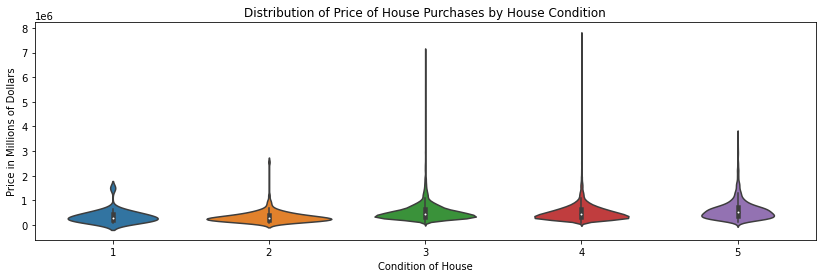

In [34]:
# Overall price distribution

plt.figure(figsize=(14,4))

cond_price_plot = sns.violinplot(x="condition", y="price", data=df)
cond_price_plot.set(xlabel="Condition of House", ylabel="Price in Millions of Dollars", title="Distribution of Price of House Purchases by House Condition")
plt.show()

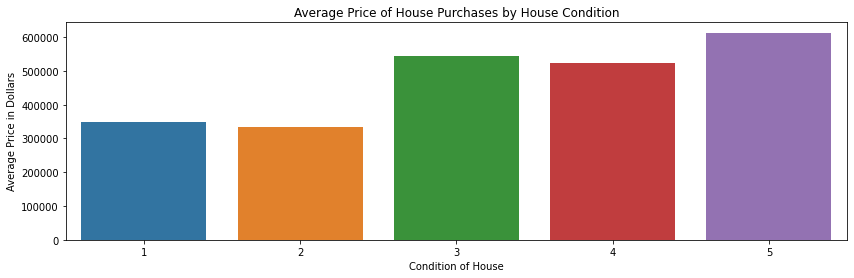

In [35]:
# Average prices

plt.figure(figsize=(14,4))

cond_group = df.groupby(by=["condition"])
cond_price = cond_group["price"].mean()
cond_avg_price_plot = sns.barplot(x=cond_price.index, y=cond_price.values)
cond_avg_price_plot.set(xlabel="Condition of House", ylabel="Average Price in Dollars", title="Average Price of House Purchases by House Condition")
plt.show()

As we can see, when the condition of the house is 3 or higher, its price is far greater. However, this is interesting as houses of conditions 1 and 2 are fairly rare. This might be due to some kind of selection bias, as poorer houses might be less likely to be sold in the first place. However, it's interesting to note that, amongst houses of conditions 3-5, there's not a strict increase. Condition 4 houses on average less costly than condition 3 houses, but are also a little less common. Condition 5 houses are the clear highest, but, as we gleaned from the map, this may also be due to being waterfront, which we will examine next.

**Waterfront**

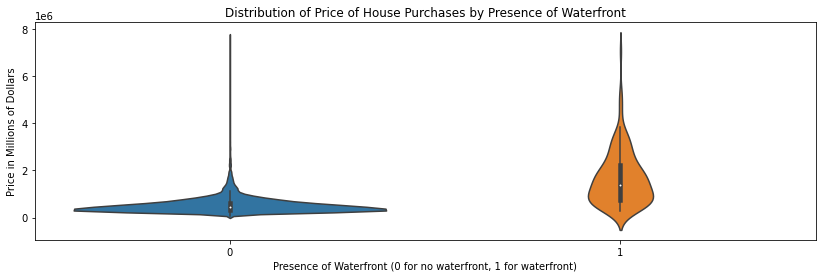

In [36]:
# Overall price distribution

plt.figure(figsize=(14,4))

water_price_plot = sns.violinplot(x="waterfront", y="price", data=df)
water_price_plot.set(xlabel="Presence of Waterfront (0 for no waterfront, 1 for waterfront)", ylabel="Price in Millions of Dollars", title="Distribution of Price of House Purchases by Presence of Waterfront")
plt.show()

There are a few outliers in both situations, but due to there being far fewer houses with a waterfront, the outliers will affect that group more, which is something we need to be careful of. However, the houses with a waterfront are overall more spread than those without pricewise, so it's reasonable to assume that its average will likely be higher regardless of outliers.

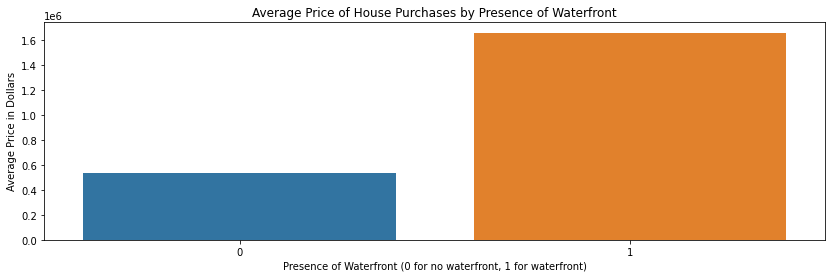

In [37]:
# Average prices

plt.figure(figsize=(14,4))

water_group = df.groupby(by=["waterfront"])
water_price = water_group["price"].mean()
water_avg_price_plot = sns.barplot(x=water_price.index, y=water_price.values)
water_avg_price_plot.set(xlabel="Presence of Waterfront (0 for no waterfront, 1 for waterfront)", ylabel="Average Price in Dollars", title="Average Price of House Purchases by Presence of Waterfront")
plt.show()

Keeping in mind the presence of outliers from earlier, it still seems that there is a big difference pricewise between houses with a waterfront and houses without. This is in line with what we saw from the map earlier. There are various reasons why a waterfront could cost more, but the explanations are out of scope for just this exploratory data analysis.

## Hypothesis Testing

Based on our exploratory analysis, we have a good idea of which features might affect the price of a house in King County. We will now focus on developing a [linear regression model](http://faculty.marshall.usc.edu/gareth-james/ISL/ISLR%20Seventh%20Printing.pdf) to predict the price of a house. For this project, we will be fitting our regression line using the most common method of least squares. 

Before continuing, let's first prepare the Dataframe for regression. For our simple model, we will exclude the `id`, `day_of_week`, `day`, `month`, `year`, `lat`, `long`, or `zipcode` columns. These variables do not provide intrinsic value in the prediction of prices. We also exclude `yr_renovated` and `is_renovated` as there are only 910 houses that were renovated between 2014-2015. Similarly, we excluse `waterfront` as there are only 163 waterfront houses in the Dataframe.

In [38]:
X = df.drop(["id","day_of_week", "yr_renovated", "is_renovated", "waterfront","day", "month", "lat", "long", "zipcode", "year"], axis=1)
X

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,view,condition,grade,sqft_above,sqft_basement,yr_built,sqft_living15,sqft_lot15
16768,437500.0,3,2.25,1970,35100,2.0,0,4,9,1970,0,1977,2340,35100
9596,790000.0,3,2.50,2600,4750,1.0,0,4,9,1700,900,1951,2380,4750
9587,675000.0,5,2.50,2820,67518,2.0,0,3,8,2820,0,1979,2820,48351
20602,555000.0,4,2.50,3310,6500,2.0,0,3,8,3310,0,2012,2380,5000
11577,440000.0,4,2.25,2160,8119,1.0,0,3,8,1080,1080,1966,1850,9000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7898,183000.0,3,1.00,1170,7320,1.0,0,3,7,1170,0,1962,2040,7320
928,359000.0,2,2.75,1370,1140,2.0,0,3,8,1080,290,2009,1370,1090
5637,450000.0,5,2.00,1870,7344,1.5,0,3,7,1870,0,1960,1870,7650
13053,445500.0,2,1.75,1390,6670,1.0,0,3,6,720,670,1941,920,6380


Linear regression has 5 key assumptions:
* The input variables are independent from one another
* The true relationship between independent and dependent variables is linear
* The model error is normally distributed
* The model errors are homoscedastic (in other orders, variability in output does not change as inputs change)

We've shown through EDA that we should be safe assuming that our features have a linear relationship with price. What we need to do now is ensure that our features are independent from one another. To verify this, let's create a [correlation matrix](https://www.displayr.com/what-is-a-correlation-matrix/) to view the relationship between our features.

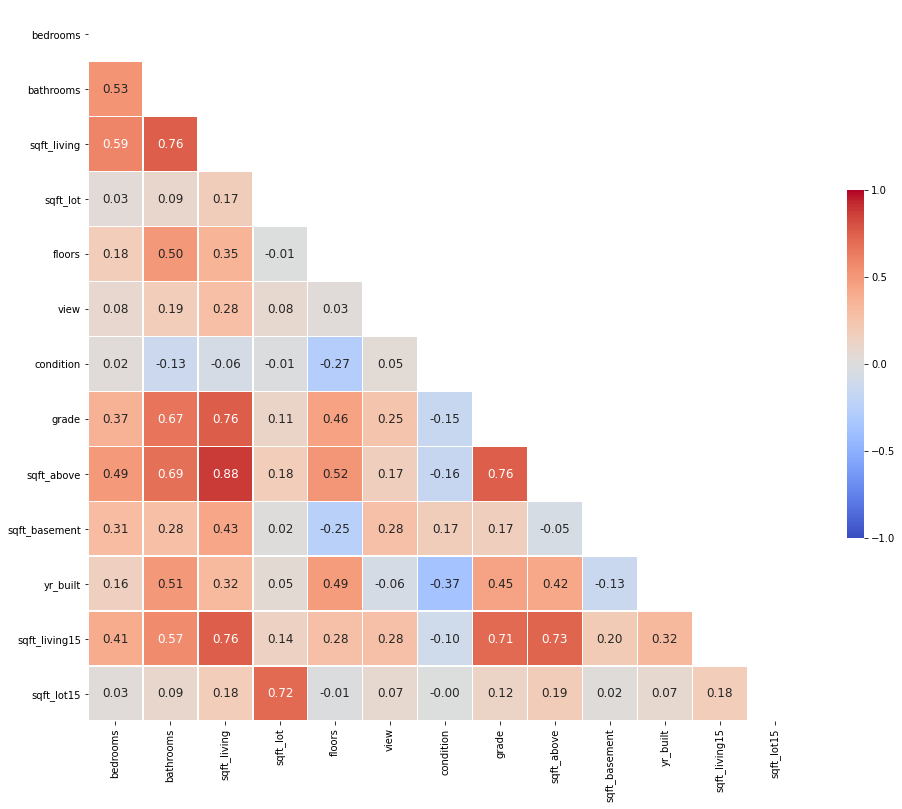

In [39]:
# Check out https://towardsdatascience.com/annotated-heatmaps-in-5-simple-steps-cc2a0660a27d to learn more about this code!
f, ax = plt.subplots(figsize=(16, 16)) 

corrMatrix = X.drop("price",axis=1).corr()
mask = np.zeros_like(corrMatrix, dtype=np.bool)
mask[np.triu_indices_from(mask)]= True
sns.heatmap(corrMatrix, 
            mask=mask,
            square = True,
            linewidths = .5,
            cmap = "coolwarm",
            cbar_kws = {'shrink': .4, 
                    "ticks" : [-1, -.5, 0, 0.5, 1]},
            vmin = -1, 
            vmax = 1,
            annot = True,
            annot_kws = {"size": 12},
            fmt = ".2f")

ax.set_yticklabels(corrMatrix.columns, rotation = 0)
ax.set_xticklabels(corrMatrix.columns)
plt.show()

We have chosen to view the correlation matrix as a heatmap. Red cells indicate variables with positive correlation; blue cells indicate variables with negative correlation. The intensity of the color matches the strength of the correlation. It looks like some of our variables are collinear. This breaks assumptions required for linear regression. 

In order to create independent inputs for our model, we will find orthogonal components among our input variables using [Principal Component Analysis](https://builtin.com/data-science/step-step-explanation-principal-component-analysis) (PCA). PCA provides the added benefit of dimensionality reduction - reducing the number of input variables for our model. This will better capture the "essence" of our dataset and lower the chances of an [overfitting](https://www.unite.ai/what-is-overfitting/). 

The downside to PCA comes in the form of a reduction in result interpretability. Coefficients of a principal component in a regression model do not provide as much insight into the relations between independent and dependent variables. Thus, we sacrifice interpretability for accuracy.

First, we must first standardize our input data in order to maximize variance and the effect of PCA. We then use PCA to select components until they explain at least 80% of the variance in the data. Next, we transform our dataframe from collinear input variables into orthogonal principal components and store them in a new Dataframe.

In [40]:
X_ = X.drop(["price"], axis=1)
x = preprocessing.StandardScaler().fit_transform(X_.values)

pca = decomposition.PCA(n_components=.85)
components = pca.fit_transform(x)
pca_df = pd.DataFrame(data = components, columns=["PC"+str(i) for i in range(1, components.shape[1]+1) ])
pca_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7
0,0.834523,-0.330428,0.993173,-0.249437,-1.292710,0.457758,-0.634719
1,0.488472,1.538731,-0.942503,-0.225730,-0.027299,-0.213155,-1.466825
2,2.542715,-0.161191,1.533352,-1.003149,-0.048555,-0.694715,1.232852
3,2.449598,-1.480011,-0.143836,-0.470271,-0.155325,-0.360746,0.207684
4,-0.121114,1.101796,-0.801796,-0.274158,1.879202,-0.073200,-0.210351
...,...,...,...,...,...,...,...
21420,-1.954424,-0.391224,0.273912,0.327240,0.246814,-1.143089,-0.135827
21421,-0.486297,-1.831861,-0.036272,0.715680,0.713416,1.578398,-0.910509
21422,-0.093520,-0.362421,-0.297258,-0.902625,0.333950,-0.724831,1.646430
21423,-2.938580,0.393784,-0.090758,0.528558,1.246843,0.197309,-0.187743


PCA transforms our original dataframe using a weight matrix. This weight matrix indicates the importance of each input variables in creating each principal component. Below is a heatmap plotting the PCA weight matrix. 

Note for example that `sqft_lot` and `sqft_lot15` have high correlation and can be explained by a single principal component.

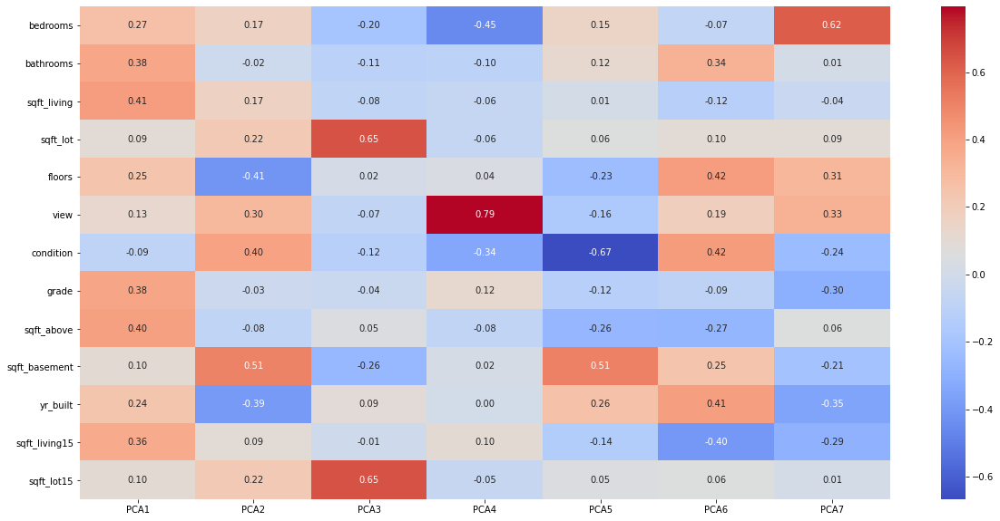

In [41]:
f, ax = plt.subplots(figsize=(20, 10)) 

sns.heatmap(pca.components_.T, 
                cmap = "coolwarm", 
                yticklabels=X.drop("price", axis=1).columns,
                xticklabels=[ "PCA"+str(x) for x in range(1,components.shape[1]+1)],
                annot = True,
                fmt = ".2f")
plt.show()

We are now ready to fit an ordinary-least-squares linear regression model to our Dataframe. Let's split our data into a training and testing set and train our model!

We pose a null hypothesis that there is no relationship between house pricing and our principal components.

In [42]:
X_pca = pca_df
y = df["price"].rename("Log of Actual Price")

X_pca_train, X_pca_test, y_pca_train, y_pca_test = model_selection.train_test_split(X_pca, y)

y_pca_train = y_pca_train.transform(np.log)
y_pca_test = y_pca_test.transform(np.log)

X_pca_train = sm.add_constant(X_pca_train)
X_pca_test = sm.add_constant(X_pca_test)

# Linear Regression on Principal Components
pca_est = sm.OLS(list(y_pca_train), X_pca_train).fit()
print("Using PCA:")
print(pca_est.summary())
y_pca_pred = pca_est.predict(X_pca_test)
y_pca_pred = y_pca_pred.rename("Log of Predicted Price")

Using PCA:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.578
Model:                            OLS   Adj. R-squared:                  0.578
Method:                 Least Squares   F-statistic:                     3143.
Date:                Mon, 21 Dec 2020   Prob (F-statistic):               0.00
Time:                        15:33:52   Log-Likelihood:                -5402.1
No. Observations:               16068   AIC:                         1.082e+04
Df Residuals:                   16060   BIC:                         1.088e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.0541      0.003   4884.2

In [43]:
# Print the P-value for each coefficient
print(pca_est.summary2().tables[1]['P>|t|'])

const     0.000000e+00
PC1       0.000000e+00
PC2       0.000000e+00
PC3      4.608429e-134
PC4      9.091084e-112
PC5      1.967913e-234
PC6       3.141864e-50
PC7       3.050806e-22
Name: P>|t|, dtype: float64


In [44]:
# Print the root mean square error
print("Root Mean Square Error: ", eval_measures.rmse(y_pca_test, y_pca_pred))

Root Mean Square Error:  0.34035121878667896


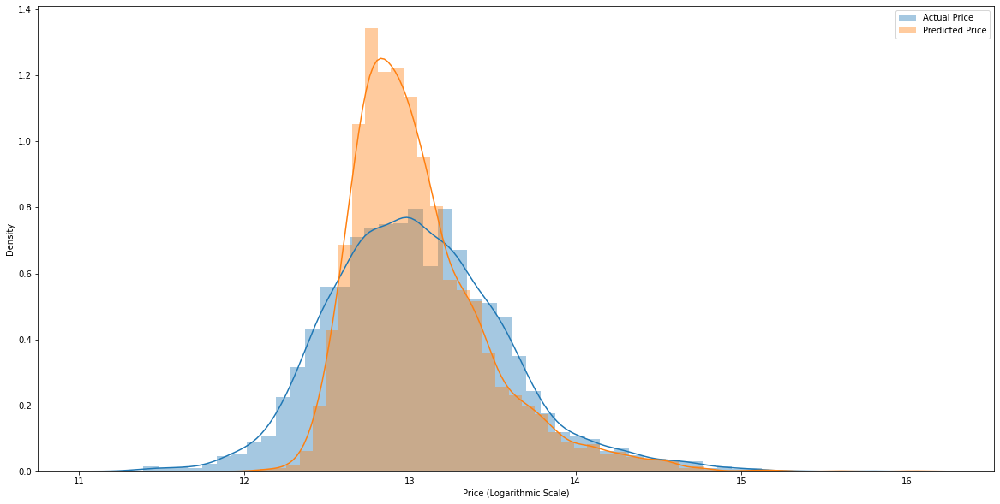

In [45]:
# Plot distribution of predictions
f, ax = plt.subplots(figsize=(20, 10)) 
sns.distplot(y_pca_test, hist=True, label="Actual Price")
sns.distplot(y_pca_pred, hist=True, label="Predicted Price")
plt.xlabel("Price (Logarithmic Scale)")
plt.legend()
plt.show()

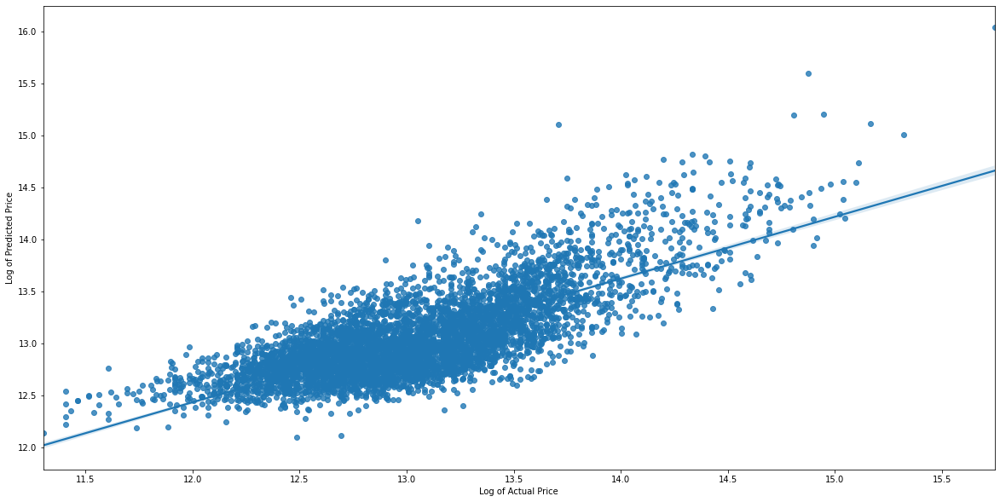

In [46]:
# Plot prediction versus real value scatterplot
f, ax = plt.subplots(figsize=(20, 10)) 
sns.regplot(x=y_pca_test, y =y_pca_pred)
plt.show()

Thus we have created a linear regression model that predicts the price for a house in King County, WA between 2014-2015 given desired parameters for `bedrooms`, `bathrooms`, `sqft_living`, `sqft_lot`, `floors`, `view`, `condition`, `grade`, `sqft_above`, `sqft_basement`, `yr_built`, `sqft_living15`, and `sqft_lot15`.

We are able to reject the null hypothesis that there is no relationship between house prices and our principal components. Each principal component has a coefficient with [P-Value](https://www.statsdirect.com/help/basics/p_values.htm) significantly less than $\alpha = 0.01$. This means that our predictors have an effect on the dependent variable. For example, PC3 was mostly weighted by `sqft_lot` and `sqft_lot15` and had a strong negative relationship on house pricing. As the square footage on a property's lot increased, price was seen to go down. This may be explained by the fact that houses with larger land lots are situated in rural areas, and will be priced much lower than houses in urban areas. 

However, our model is not perfect. It's [coefficient of determination - $R^2$](https://www.investopedia.com/terms/r/r-squared.asp) is just below 0.60. Since we are working with real world data that is inherently noisy, this is not a bad value. However, this still means that more than 40% of the variance in housing prices cannot be explained by the selected principal components or in turn the original input features. Additionally, the model's Root Mean Square Error is 0.3 which means the predict prices are within a factor of $10^{0.3} \approx 2$ of the observed prices. This harms the model's usability, as doubling a house's price significantly changes its affordability. Since our features already take into account several basic characteristics found in houses, we are unlikely to create more accurate price predictions without additional information.

## Conclusion

Shopping for houses is an important step in many people's lives. Everyone wants to buy low and, possibly in the future, sell high. Figuring out what traits affect the prices of houses in what ways can go a long way in learning how to shop for houses and what strategies to employ to maximize gain while minimizing loss. So, what have we learned?

1. We reject the null hypothesis that there's no relationship between house prices and factors like the number of bedrooms, bathrooms, square foot living space, etc. This suggests that these factors do have an effect on the price.
2. Location matters! The location of the house seemed to play a role in the price greatly, with houses at waterfront and near Seattle or Bellevue being more expensive than houses inland in Kent.
3. Bigger is better, for the most part. Square foot lot space was king in correlations. While aspects like number of bedrooms also showed a steady increasing trend, the number of bathrooms and floors were a little more inconsistent. Furthermore, the houses with high numbers in those factors were fairly rare, making it difficult to evaluate the overall trend with it.

Overall, we learned a lot about housing and the factors that go into price. Even with all this information, there's still plenty of room for learning in the future. For example, what about the proximity of these houses to the local grocery store? How about to good schools? Transportation? There's plenty of more data exploration out there that can be done to further optimize and figure out what makes a house worth what it's worth.